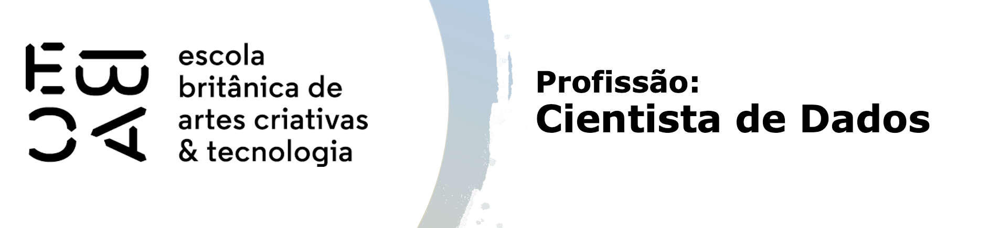

# Tarefa

Neste exercício vamos usar a base [online shoppers purchase intention](https://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset) de Sakar, C.O., Polat, S.O., Katircioglu, M. et al. Neural Comput & Applic (2018). [Web Link](https://doi.org/10.1007/s00521-018-3523-0).

A base trata de registros de 12.330 sessões de acesso a páginas, cada sessão sendo de um único usuário em um período de 12 meses, para posteriormente estudarmos a relação entre o design da página e o perfil do cliente - "Será que clientes com comportamento de navegação diferentes possuem propensão a compra diferente?" 

Nosso objetivo é tentar agrupar os clientes conforme seu comportamento de navegação entre páginas administrativas, informativas e de produtos. 

As variáveis estão descritas abaixo (em tradução livre do link indicado).

Por este motivo, o escopo desta análise estará fechado nas primeiras seis variáveis da tabela, referentes a quantidade e tempo de acesso por tipo de página, atributos que falam mais do comportamento de navegação do cliente que de características da página o da época do ano.

|Variavel                |Descrição          | 
|------------------------|:-------------------| 
|Administrative          | Quantidade de acessos em páginas administrativas| 
|Administrative_Duration | Tempo de acesso em páginas administrativas | 
|Informational           | Quantidade de acessos em páginas informativas  | 
|Informational_Duration  | Tempo de acesso em páginas informativas  | 
|ProductRelated          | Quantidade de acessos em páginas de produtos | 
|ProductRelated_Duration | Tempo de acesso em páginas de produtos | 
|BounceRates             | *Percentual de visitantes que entram no site e saem sem acionar outros *requests* durante a sessão  | 
|ExitRates               | * Soma de vezes que a página é visualizada por último em uma sessão dividido pelo total de visualizações | 
|PageValues              | * Representa o valor médio de uma página da Web que um usuário visitou antes de concluir uma transação de comércio eletrônico | 
|SpecialDay              | Indica a proximidade a uma data festiva (dia das mães etc) | 
|Month                   | Mês  | 
|OperatingSystems        | Sistema operacional do visitante | 
|Browser                 | Browser do visitante | 
|Region                  | Região | 
|TrafficType             | Tipo de tráfego                  | 
|VisitorType             | Tipo de visitante: novo ou recorrente | 
|Weekend                 | Indica final de semana | 
|Revenue                 | Indica se houve compra ou não |

\* variávels calculadas pelo google analytics

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from ydata_profiling import ProfileReport
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from tqdm.notebook import tqdm

%matplotlib inline

In [2]:
df = pd.read_csv('online_shoppers_intention.csv')

In [3]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [4]:
# Analisando quem comprou
df.Revenue.value_counts(dropna=False)

False    10422
True      1908
Name: Revenue, dtype: int64

## Análise descritiva

Faça uma análise descritiva das variáveis do escopo.

- Verifique a distribuição dessas variáveis
- Veja se há valores *missing* e caso haja, decida o que fazer
- Faça mais algum tratamento nas variáveis caso ache pertinente

In [5]:
# Há registros missing?
df.isna().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [6]:
# Qual é o tipo dos dados?
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [7]:
prof = ProfileReport(df, explorative=True)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

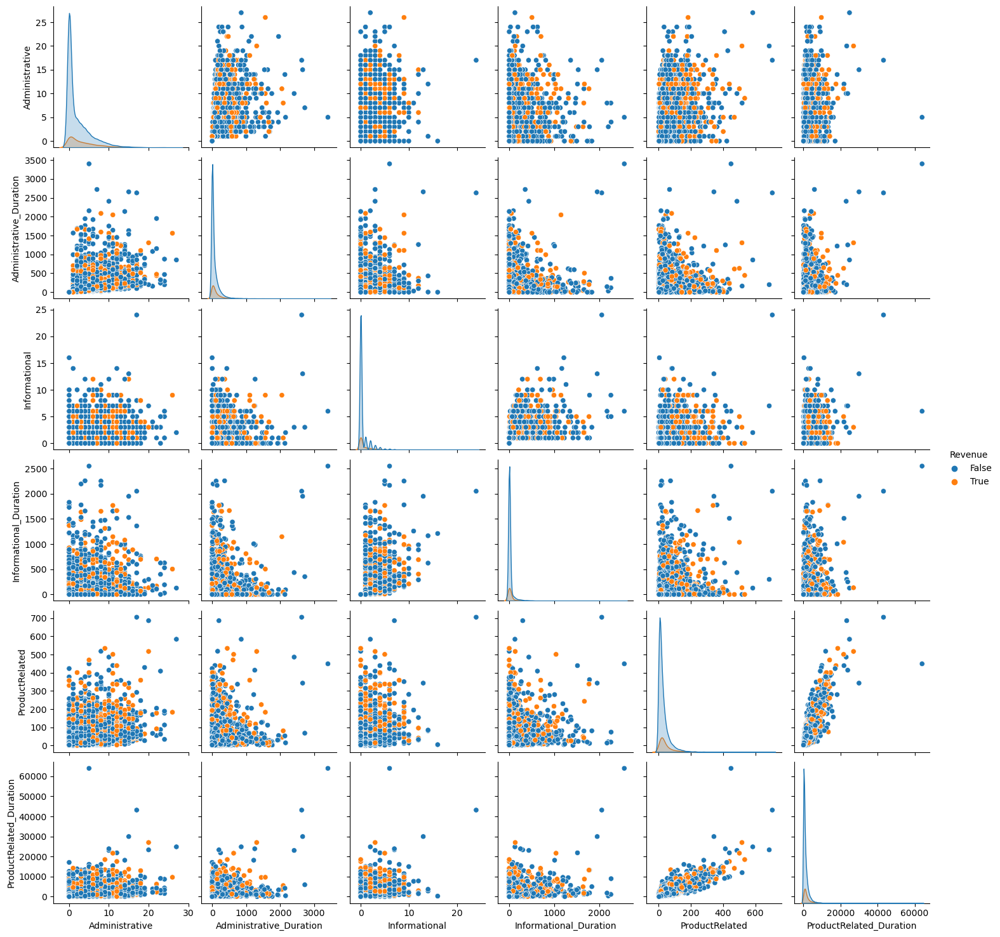

In [8]:
sns.pairplot(df[['Administrative','Administrative_Duration','Informational','Informational_Duration','ProductRelated','ProductRelated_Duration','Revenue']], hue='Revenue')

### Podemos ver que existe um certo agrupamento por compra, mas não esta bem definido, vamos realizar a pdronização e realizar o K-means

In [9]:
variaveis = ['Administrative','Administrative_Duration','Informational','Informational_Duration','ProductRelated','ProductRelated_Duration']
df_pad = df[variaveis]
df_pad = pd.DataFrame(StandardScaler().fit_transform(df_pad), columns = df_pad.columns)
df_pad.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration
0,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348
1,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903
2,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348
3,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954
4,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430


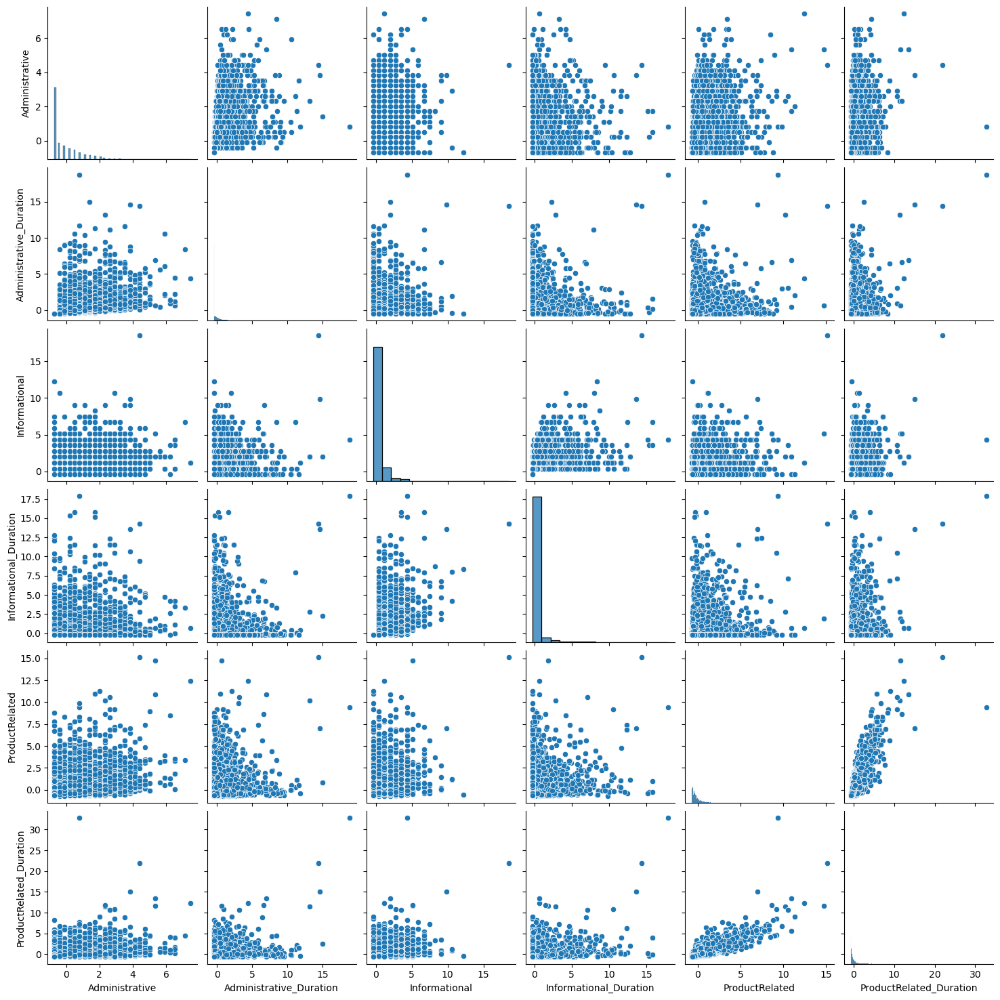

In [10]:
sns.pairplot(df_pad)

## Número de grupos

Utilize as técnicas vistas em aula que te ajudem a decidir pelo número de grupos a ser utilizados.

### Método do cotovelo

In [11]:
SQD = []
K = range(1,5)
for k in tqdm(K):
    km = KMeans(n_clusters=k)
    km = km.fit(df_pad)
    SQD.append(km.inertia_)

  0%|          | 0/4 [00:00<?, ?it/s]

<AxesSubplot:xlabel='num_clusters'>

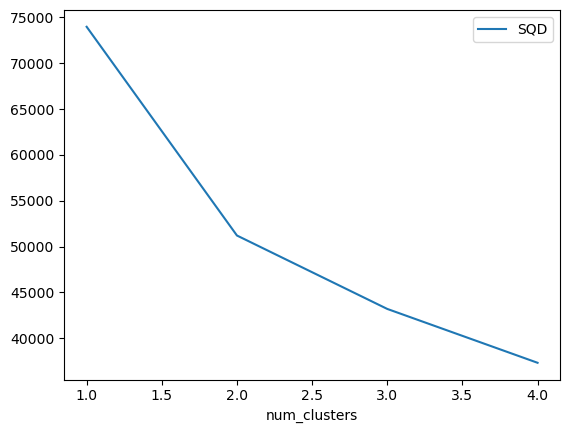

In [12]:
df1 = pd.DataFrame({'num_clusters': list(range(1, len(SQD)+1)), 'SQD': SQD})
df1.plot(x = 'num_clusters', y = 'SQD')

## Poderiamos considere 2 ou 3 aqui

### Metodo da Silueta

In [13]:
df_pad

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration
0,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348
1,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903
2,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348
3,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954
4,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430
...,...,...,...,...,...,...
12325,0.206173,0.363075,-0.396478,-0.244931,0.478227,0.307822
12326,-0.696993,-0.457191,-0.396478,-0.244931,-0.601062,-0.380957
12327,-0.696993,-0.457191,-0.396478,-0.244931,-0.578577,-0.528063
12328,0.507228,-0.032916,-0.396478,-0.244931,-0.376210,-0.443536


In [14]:
# Inicializar uma lista vazia que vai conter os valores da silueta média
siluetas = []
# Este é o número máximo de grupos que vamos testar
max_clusters = 5

# O loop percorre de 2 até o máximo de clusters
for n_clusters in tqdm(range(2, max_clusters+1)):
    # Aqui rodamos o k-means
    km = KMeans(n_clusters=n_clusters).fit(df_pad[variaveis])
    # Aqui calculamos a silueta e guardamos o resultado na lista 'siluetas'
    siluetas.append(silhouette_score(df_pad[variaveis], km.labels_))
    # Essa list comprehendion define o nome dos grupos
    nomes_grupos = ['grupo_' + str(g) for g in range(n_clusters)]
    # Agora vamos adicionar uma coluna no dataframe com o agrupamento construido
    df_pad['grupos_'+str(n_clusters)] = pd.Categorical.from_codes(km.labels_, categories = nomes_grupos)


  0%|          | 0/4 [00:00<?, ?it/s]

<AxesSubplot:xlabel='n_clusters'>

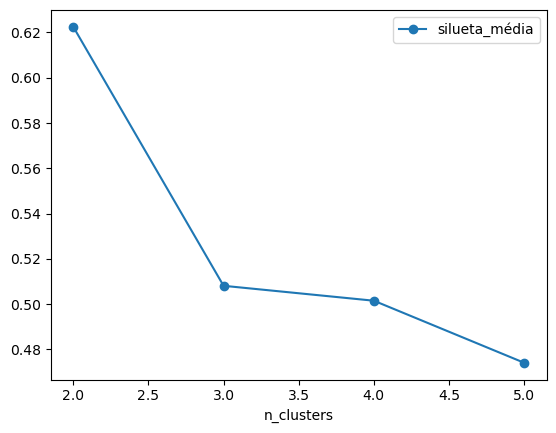

In [15]:

df_silueta = pd.DataFrame({'n_clusters': list(range(2, max_clusters+1)), 'silueta_média': siluetas})

df_silueta.plot.line(x = 'n_clusters', y = 'silueta_média', marker='o')
# plt.scatter(x = df_silueta.n_clusters, y = df_silueta.silueta_média)

## Analisando as duas tecnicas e tendo o conhecimanto que queremos saber quem ira comprar em quam não irá comprar podemos usar a separação em 2 grupos. 

## Avaliação dos grupos

Faça uma análise descritiva para pelo menos duas soluções de agrupamentos (duas quantidades diferentes de grupos) sugeridas no item anterior, utilizando as variáveis que estão no escopo do agrupamento.
- Com base nesta análise e nas análises anteriores, decida pelo agrupamento final. 
- Se puder, sugira nomes para os grupos.

In [16]:
df_pad['compra'] = df['Revenue']
df_pad['compra'] = df_pad['compra'].map({False: 0, True: 1})
df_pad

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,grupos_2,grupos_3,grupos_4,grupos_5,compra
0,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,grupo_0,grupo_2,grupo_0,grupo_4,0
1,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903,grupo_0,grupo_2,grupo_0,grupo_4,0
2,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,grupo_0,grupo_2,grupo_0,grupo_4,0
3,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954,grupo_0,grupo_2,grupo_0,grupo_4,0
4,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430,grupo_0,grupo_2,grupo_0,grupo_4,0
...,...,...,...,...,...,...,...,...,...,...,...
12325,0.206173,0.363075,-0.396478,-0.244931,0.478227,0.307822,grupo_0,grupo_2,grupo_0,grupo_0,0
12326,-0.696993,-0.457191,-0.396478,-0.244931,-0.601062,-0.380957,grupo_0,grupo_2,grupo_0,grupo_4,0
12327,-0.696993,-0.457191,-0.396478,-0.244931,-0.578577,-0.528063,grupo_0,grupo_2,grupo_0,grupo_4,0
12328,0.507228,-0.032916,-0.396478,-0.244931,-0.376210,-0.443536,grupo_0,grupo_2,grupo_0,grupo_4,0


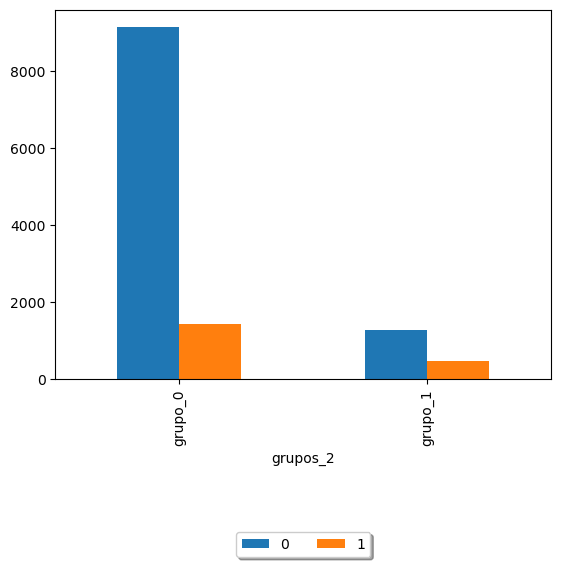

In [17]:
ax = df_pad.groupby(['grupos_2', 'compra'])['compra'].count().unstack().plot.bar()

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -.5),
          ncol=3, fancybox=True, shadow=True);

O Kmeans separou me 2 grupos porem o grupo 1 acabou ficando bem dividido entre os dois grupos, esse modelo não esta muito adequado.

## Avaliação de resultados

Avalie os grupos obtidos com relação às variáveis fora do escopo da análise (minimamente *bounce rate* e *revenue*). 
- Qual grupo possui clientes mais propensos à compra?

In [18]:
variaveis = ['SpecialDay','BounceRates','Revenue','Administrative','Administrative_Duration','Informational','Informational_Duration','ProductRelated','ProductRelated_Duration']
df_pad2 = df[variaveis]
df_pad2 = pd.DataFrame(StandardScaler().fit_transform(df_pad2), columns = df_pad2.columns)
df_pad2.head()

,SpecialDay,BounceRates,Revenue,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration
0,-0.308821,3.667189,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348
1,-0.308821,-0.457683,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903
2,-0.308821,3.667189,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348
3,-0.308821,0.573535,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954
4,-0.308821,-0.045196,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430


In [19]:
SQD = []
K = range(1,5)
for k in tqdm(K):
    km = KMeans(n_clusters=k)
    km = km.fit(df_pad2[variaveis])
    SQD.append(km.inertia_)

  0%|          | 0/4 [00:00<?, ?it/s]

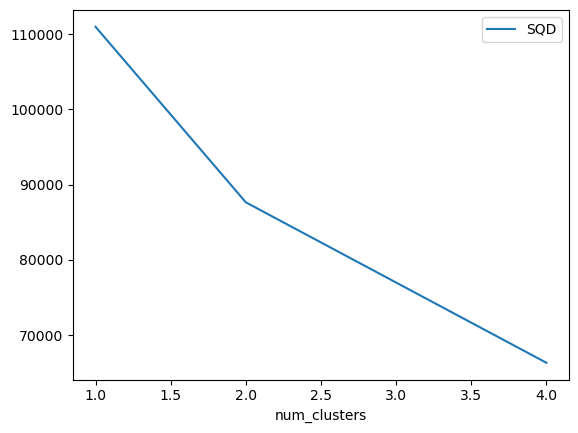

In [20]:
df = pd.DataFrame({'num_clusters': list(range(1, len(SQD)+1)), 'SQD': SQD})
df.plot(x = 'num_clusters', y = 'SQD');

In [21]:
# Inicializar uma lista vazia que vai conter os valores da silueta média
siluetas = []
# Este é o número máximo de grupos que vamos testar
max_clusters = 7

# O loop percorre de 2 até o máximo de clusters
for n_clusters in tqdm(range(2, max_clusters+1)):
  km2 = KMeans(n_clusters=n_clusters).fit(df_pad2[variaveis])
  unique_labels = len(np.unique(km2.labels_))
  nomes_grupos = ['grupo_' + str(g) for g in range(unique_labels)]

  # Optional: Filter outliers (adjust as needed)
  valid_labels = km2.labels_[km2.labels_ >= 0]

  siluetas.append(silhouette_score(df_pad2[variaveis], valid_labels))
  df_pad2['grupos_' + str(n_clusters)] = pd.Categorical.from_codes(valid_labels, categories=nomes_grupos)

  0%|          | 0/6 [00:00<?, ?it/s]

<AxesSubplot:xlabel='n_clusters'>

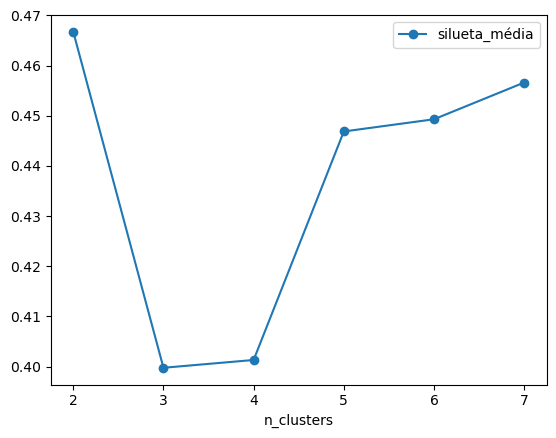

In [22]:
df_silueta = pd.DataFrame({'n_clusters': list(range(2, max_clusters+1)), 'silueta_média': siluetas})

df_silueta.plot.line(x = 'n_clusters', y = 'silueta_média', marker='o')
# plt.scatter(x = df_silueta.n_clusters, y = df_silueta.silueta_média)

In [23]:
df_pad2.head()

,SpecialDay,BounceRates,Revenue,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,grupos_2,grupos_3,grupos_4,grupos_5,grupos_6,grupos_7
0,-0.308821,3.667189,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,grupo_1,grupo_0,grupo_3,grupo_4,grupo_5,grupo_5
1,-0.308821,-0.457683,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903,grupo_1,grupo_1,grupo_2,grupo_1,grupo_2,grupo_3
2,-0.308821,3.667189,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,grupo_1,grupo_0,grupo_3,grupo_4,grupo_5,grupo_5
3,-0.308821,0.573535,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954,grupo_1,grupo_1,grupo_2,grupo_1,grupo_2,grupo_3
4,-0.308821,-0.045196,-0.427872,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430,grupo_1,grupo_1,grupo_2,grupo_1,grupo_2,grupo_3


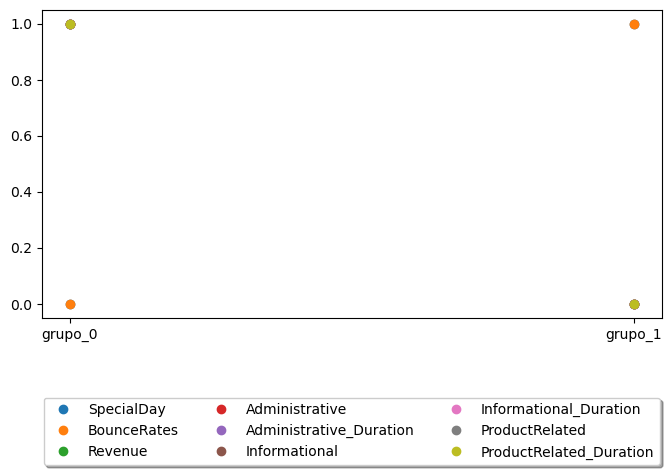

In [24]:
padroniza = lambda x: (x - x.min())/(x.max() - x.min())

fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(df_pad2.groupby(['grupos_2'])[variaveis].mean().apply(padroniza), 'o ')
ax.legend(variaveis, loc='lower center', bbox_to_anchor=(0.5, -.5),
          ncol=3, fancybox=True, shadow=True)

In [25]:
pca = PCA(n_components=2)
componentes = pca.fit_transform(df_pad2[variaveis])

In [26]:
def biplot(score,coeff, y, labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 2/(xs.max() - xs.min())
    scaley = 2/(ys.max() - ys.min())
    
    fig, ax = plt.subplots(figsize=(10, 10))
#     scatter = ax.scatter(xs * scalex,ys * scaley, c = y)
    sns.kdeplot(x = xs * scalex, y = ys * scaley, hue=y, ax=ax, fill=True, alpha=.6, palette='viridis')
#     ax.legend(*scatter.legend_elements())
    
    for i in range(n):
        ax.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5, 
                 length_includes_head=True, head_width=0.04, head_length=0.04)
        if labels is None:
            ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'k', ha = 'center', va = 'center')
        else:
            ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'k', ha = 'center', va = 'center')
    ax.set_xlim(-1.2,1.2)
    ax.set_ylim(-1.2,1.2)
    ax.set_xlabel("PC{0}, {1:.1%} da variância explicada".format(1, pca.explained_variance_ratio_[0]))
    ax.set_ylabel("PC{0}, {1:.1%} da variância explicada".format(1, pca.explained_variance_ratio_[1]))
    ax.grid()


#Call the function. Use only the 2 PCs.


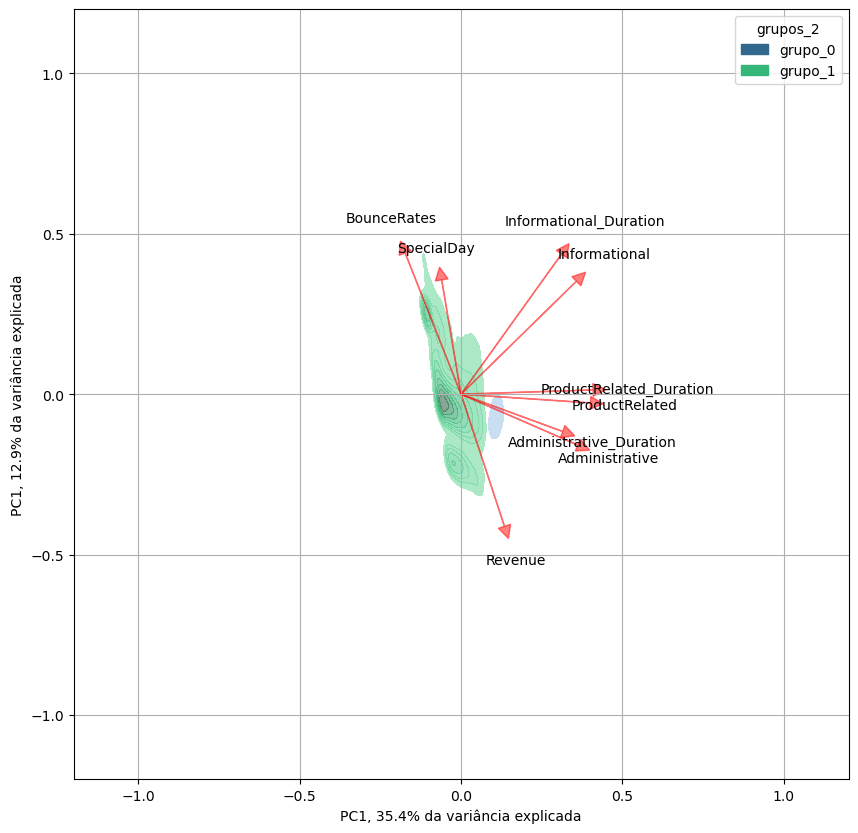

In [27]:
biplot(componentes,
       np.transpose(pca.components_[0:2, :]), 
       df_pad2['grupos_2'],
       labels = variaveis)
plt.show()

## Poderíamos considerar essas duas categorias como provavel comprador ou não, sendo que um grupo tme uma componente muito imporante de tempo de pagina, ou seja, o cliente deve estar escolhendo algo com baixo bounce rate. 